In [1]:
import os
from timeit import default_timer as timer

import matplotlib.pyplot as plt
import numpy as np

# Pytorch
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import Tensor
from torch.utils.data import Dataset, DataLoader
from torchinfo import summary

# Data path

In [2]:
train_file_path = './train_samples/'
valid_file_path = './validation_samples/'
input_file_name = 'c_segs_all_'
target_file_name = 'ground_truth_'
nfiles, nfiles_valid, nsegs, nlags = 140000, 60000, 119, 1501
nhalf = int((nlags + 1) / 2)

# Configurations of neural network and training parameters

In [3]:
# Parameters used in Transformer
d_model = 256
nhead = int(d_model / 64)
dim_feedforward = d_model * 4
num_layers = 6

# Define the model hyperparameters
config = {
    'seed': 1,                  # Seed number.
    'n_epochs': 50,             # Number of epochs
    'print_each': 200,          # Every numbers to print the training loss
    'batch_size': 128,          # Batch size
    'k': 0.25,                  # Tunable scalar in learning rate schedule
    'warmup_k': 4000,           # Warmup steps in learning rate schedule
    'weight_decay': 1e-2,       # Weight decay
    'save_path': './models/model_dict_ccformer',   # Model will be saved here.
    'device': 0,                                   # GPU device used in the trainning
    'mode': 0                                      # 1 for training and 0 for inference
}

torch.set_float32_matmul_precision('high')

# Fixes random number generator seeds for reproducibility

In [4]:
torch.manual_seed(config['seed'])
np.random.seed(config['seed'])
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(config['seed'])
    device = torch.device('cuda', config['device'])
    torch.cuda.set_device(device)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
else:
    device = torch.device('cpu')

# Dataset

In [5]:
class CC_Dataset(Dataset):
    def __init__(self, file_path, input_file_name, target_file_name, nfiles):
        self.file_path = file_path
        self.input_file_name = input_file_name
        self.target_file_name = target_file_name
        self.nfiles = nfiles
    
    def __len__(self):
        return self.nfiles

    def __getitem__(self, idx):
        # input
        x = np.load(self.file_path + self.input_file_name + str(idx + 1) + '.npy')
        x = x / np.max(np.abs(x), axis=-1, keepdims=True)

        # target
        y = np.load(self.file_path + self.target_file_name + str(idx + 1) + '.npy')
        y = y / np.max(np.abs(y))

        return torch.Tensor(x), torch.Tensor(y)

# Neural network

In [6]:
# Module to convert tensor of source into corresponding tensor after linear embedding
class LinearEmbedding(nn.Module):
    def __init__(self, src_size: int, emb_size: int):
        super(LinearEmbedding, self).__init__()
        self.embedding = nn.Linear(src_size, emb_size, bias=False)

    def forward(self, src: Tensor):
        return self.embedding(src)

# Network
class CCformer(nn.Module):
    def __init__(self,
                 num_encoder_layers: int,
                 emb_size: int,
                 nhead: int,
                 src_size: int,
                 tgt_size: int,
                 dim_feedforward: int,
                 dropout: float = 0.1):
        super(CCformer, self).__init__()
        encoder_layer = nn.TransformerEncoderLayer(d_model=emb_size, 
                                                   nhead=nhead, 
                                                   dim_feedforward=dim_feedforward, 
                                                   dropout=dropout, 
                                                   activation="gelu", 
                                                   batch_first=True, 
                                                   norm_first=False)
        
        self.src_emb = LinearEmbedding(src_size, emb_size)
        self.encoder = nn.TransformerEncoder(encoder_layer, num_encoder_layers)
        self.generator = nn.Linear(emb_size, tgt_size)

    def forward(self,
                src: Tensor):
        src_emb = self.src_emb(src)
        weight = F.sigmoid(self.generator(self.encoder(src_emb)))
        cc_stack = torch.sum(torch.mul(src, weight), dim=1, keepdim=True)
        return cc_stack

# Do training

In [7]:
# Instantiate the model
model = CCformer(num_encoder_layers=num_layers,
                 emb_size=d_model,
                 nhead=nhead,
                 src_size=nlags,
                 tgt_size=nlags,
                 dim_feedforward=dim_feedforward).to(device)

for p in model.parameters():
    if p.dim() > 1:
        nn.init.xavier_uniform_(p)

# Define Loss function
def loss_fn(y_pred, y_true):
    y_pred_max, _ = torch.max(torch.abs(y_pred), dim=2, keepdim=True)
    y_pred = y_pred / y_pred_max
    return torch.mean(torch.square(y_pred - y_true))
    
# Define optimization algorithm. 
optimizer = torch.optim.AdamW(model.parameters(), lr=1, betas=(0.9, 0.98), eps=1e-9, weight_decay=config['weight_decay']) 

# Define learning rate schedule
lr_lambda = lambda n: config['k'] * d_model ** (-0.5) * min((n + 1) ** (-0.5), (n + 1) * config['warmup_k'] ** (-1.5))
scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lr_lambda)

summary(model)

Layer (type:depth-idx)                                            Param #
CCformer                                                          --
├─LinearEmbedding: 1-1                                            --
│    └─Linear: 2-1                                                384,256
├─TransformerEncoder: 1-2                                         --
│    └─ModuleList: 2-2                                            --
│    │    └─TransformerEncoderLayer: 3-1                          789,760
│    │    └─TransformerEncoderLayer: 3-2                          789,760
│    │    └─TransformerEncoderLayer: 3-3                          789,760
│    │    └─TransformerEncoderLayer: 3-4                          789,760
│    │    └─TransformerEncoderLayer: 3-5                          789,760
│    │    └─TransformerEncoderLayer: 3-6                          789,760
├─Linear: 1-3                                                     385,757
Total params: 5,508,573
Trainable params: 5,508,573
Non-tr

In [8]:
# Create directory of saving models.
if not os.path.isdir('models'):
    os.mkdir('models')

# Pytorch data loader loads pytorch dataset into batches.
train_loader = DataLoader(CC_Dataset(train_file_path, input_file_name, target_file_name, nfiles),
                          batch_size=config['batch_size'],
                          shuffle=True,
                          pin_memory=True)

valid_loader = DataLoader(CC_Dataset(valid_file_path, input_file_name, target_file_name, nfiles_valid), 
                          batch_size=config['batch_size'], 
                          shuffle=False,
                          pin_memory=True)

total_batches = len(train_loader)

loss_record = {'train':[], 'valid':[]}

if config['mode']:
    # Training
    for epoch in range(config['n_epochs']):
        model.train() # Set model to train mode
        loss_train = []
        start_time = timer()
        for batch_id, batch in enumerate(train_loader):
            # Get batch
            x, y = map(lambda item: item.to(device), batch)
    
            # Updating
            optimizer.zero_grad()                              # Set gradient to zero
            pred = model(x, None)                              # Forward pass
            
            loss = loss_fn(pred, y)                            # Compute loss
            loss.backward()                                    # Compute gradient(backpropagation)
            optimizer.step()                                   # Update parameters
            scheduler.step()                                   # Update learning rate
            
            # Get loss per batch
            loss_train.append(loss.item())
    
            # Print information
            if batch_id % config['print_each'] == 0:
                end_time = timer()
                time_cost = end_time - start_time if batch_id == 0 else (end_time - start_time)/config['print_each']
                start_time = end_time
                print(f"[Epoch:{epoch+1}/{config['n_epochs']}] [Batch:{batch_id+1}/{total_batches}] | Loss: {loss_train[-1]:.4f} | {time_cost:.3f} s/it")
        
        # Test the model on the validation dataset
        model.eval()                                # Set model to evalutation mode
        loss_valid = []
        for x, y in valid_loader:                              # Iterate through the dataloader
            x, y = x.to(device), y.to(device)                  # Move data to device (cpu/cuda)
            with torch.no_grad():                              # Disable gradient calculation
                pred = model(x)                                # Forward pass (compute output)
                loss = loss_fn(pred, y)                        # Compute loss
            loss_valid.append(loss.item())
            
        # Save loss per epoch
        loss_record['train'].append(np.mean(loss_train))
        loss_record['valid'].append(np.mean(loss_valid))
    
    np.save(config['save_path'] + '_train_loss.npy', loss_record['train'])
    np.save(config['save_path'] + '_valid_loss.npy', loss_record['valid'])
    
    # Save the model per epoch
    torch.save(model.state_dict(), config['save_path'] + '.ckpt')
else:
    # Inference
    state_dict = torch.load(config['save_path'] + '.ckpt')
    model.load_state_dict(state_dict)
    loss_record['train'] = np.load(config['save_path'] + '_train_loss.npy')
    loss_record['valid'] = np.load(config['save_path'] + '_valid_loss.npy')

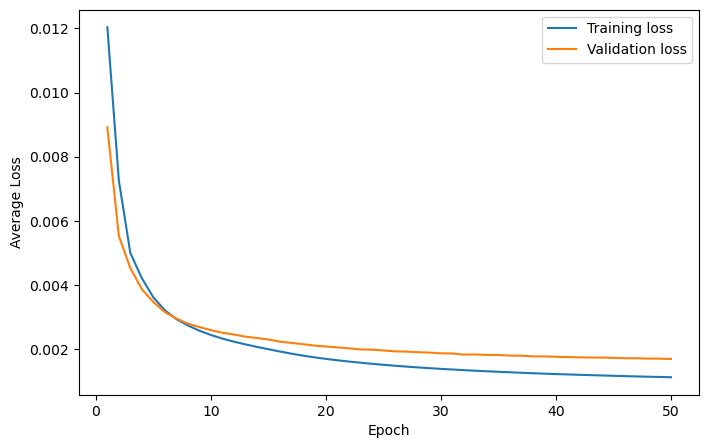

In [9]:
fig=plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
plt.plot(np.arange(1, len(loss_record['train']) + 1), loss_record['train'], label='Training loss')
plt.plot(np.arange(1, len(loss_record['valid']) + 1), loss_record['valid'], label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
ax.legend()

# Inference

In [10]:
def phase_shift(data, options):
    x = data['x'].reshape((1, -1))
    nfft = np.round(1 / (data['dt'] * options['df']))
    if nfft < data['ns']:
        nfft = 2 ** np.ceil(np.log2(np.ceil(data['ns'] / nfft))) * nfft
    
    df = 1 / (data['dt'] * nfft)
    fmin_ind = int(max(np.floor(options['fmin'] / df), 1))
    fmax_ind = int(min(np.ceil(options['fmax'] / df), np.fix(nfft / 2)))
    freq = df * np.arange(fmin_ind, fmax_ind + 1, dtype=np.int32)
    nfreq = len(freq)
    
    vel = np.arange(options['vmin'], options['vmax'] + options['dv'], options['dv'])
    nv = len(vel)

    dfft = np.fft.rfft(data['d'], int(nfft), axis=0)
    
    spec = np.zeros((nv, nfreq))
    for ifreq in range(nfreq):
        k = (2 * np.pi * freq[ifreq] / vel).reshape((-1, 1))
        phase = (dfft[ifreq + fmin_ind, :] / np.abs(dfft[ifreq + fmin_ind, :])).reshape((1, -1))
        spec[:, ifreq] = np.abs(np.sum(np.exp(1j * k * x) * phase, axis=1)) ** 2
    return freq, vel, spec

In [11]:
nlag = 401
ntr = 40
nhalf = int((nlag + 1) / 2)
dt = 0.005
nt = nhalf
lags = np.arange(-nhalf+1, nhalf)*dt
data = {
    'd':[],
    'dt':dt,
    'ns':nt,
    'ntr':ntr,
    'x':5 * np.arange(ntr),
    't':dt * np.arange(nt)
}

options = {
    'fmin': 1,
    'fmax': 30,
    'df': 0.5,
    'vmin': 200,
    'vmax': 1400,
    'dv': 0.5
}

# Theoretical dispersion curve
loaded_dc = np.load('synthetic data/dc.npz')
dc = {key: loaded_dc[key] for key in loaded_dc.files}

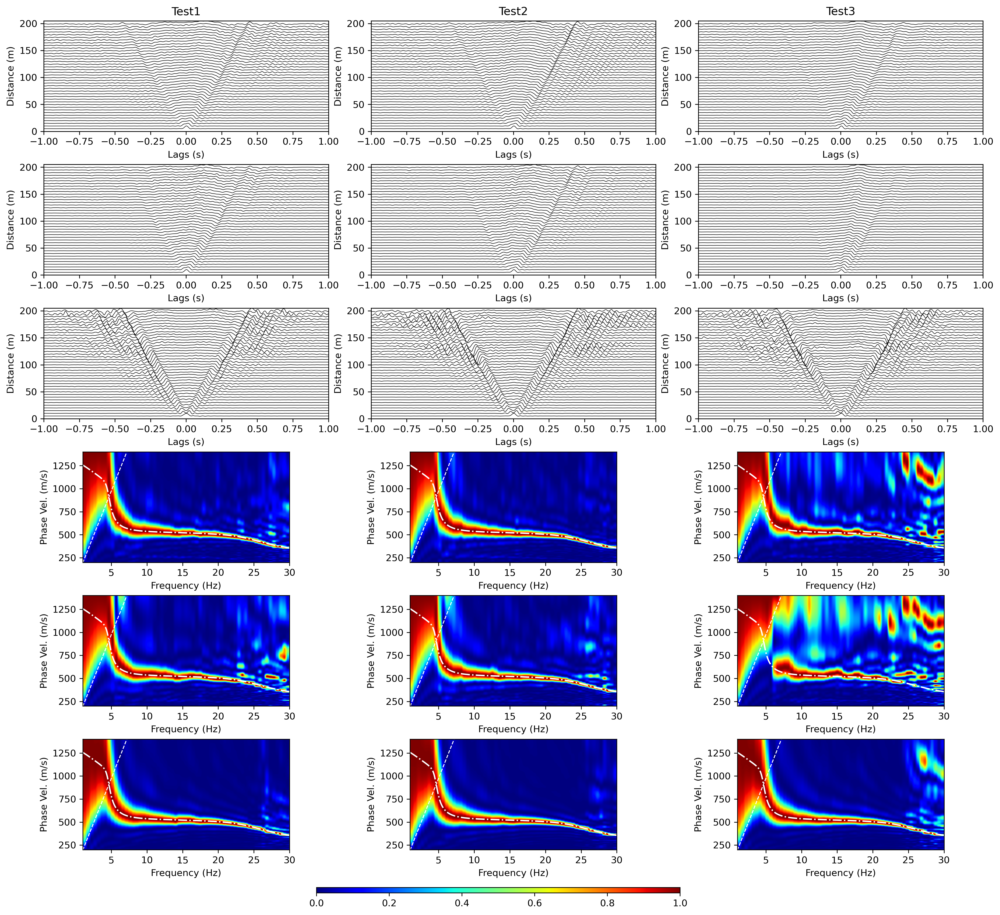

In [12]:
fig = plt.figure(figsize=(18, 16), dpi=300)
aspect = (options['fmax'] - options['fmin']) / (options['vmax'] - options['vmin']) * 0.535
wiggle_scale = 5
count = 0
for itest in [1, 2, 3]:
    x = np.load('./synthetic data/c_segs_all_test' + str(itest) + '.npy').transpose((2, 0, 1))
    coeff = np.load('./synthetic data/pwscoeff_test' + str(itest) + '.npy')

    [ntr, nseg, nlag] = x.shape
    x = x / np.max(np.abs(x), axis=-1, keepdims=True)
    model.eval()
    with torch.no_grad():
        pred = model(torch.Tensor(x).to(device))
    pred = pred.detach().cpu().numpy()
    pred = pred / np.max(np.abs(pred), axis=-1, keepdims=True)

    # remove the padding zero
    x = x[:, :, 550:-550]
    pred = pred[:, :, 550:-550]

    # LS
    plt.subplot(6,3,1+count)
    ls = np.mean(x, axis=1).T
    ls = ls / np.max(ls, axis=0)
    for itr in range(ntr):
        plt.plot(lags, wiggle_scale * ls[:, itr] + (itr + 1) * 5, 'k', linewidth=0.5)
    plt.axis([-1, 1, 0, 205])
    plt.xlabel('Lags (s)')
    plt.ylabel('Distance (m)')
    plt.title('Test' + str(itest))

    # pws
    plt.subplot(6,3,4+count)
    pws = ls * np.abs(coeff) ** 1
    pws = pws / np.max(pws, axis=0)
    for itr in range(ntr):
        plt.plot(lags, wiggle_scale * pws[:, itr] + (itr + 1) * 5, 'k', linewidth=0.5)
    plt.axis([-1, 1, 0, 205])
    plt.xlabel('Lags (s)')
    plt.ylabel('Distance (m)')

    # ccformer
    plt.subplot(6,3,7+count)
    processed = np.squeeze(pred).T
    processed = processed / np.max(processed, axis=0)
    for itr in range(ntr):
        plt.plot(lags, wiggle_scale * processed[:, itr] + (itr + 1) * 5, 'k', linewidth=0.5)
    plt.axis([-1, 1, 0, 205])
    plt.xlabel('Lags (s)')
    plt.ylabel('Distance (m)')

    # use the symmetric cross-correlation for dispersion analysis
    vsg_ls = np.zeros((nhalf, ntr))
    vsg_ls[0, :] = ls[nhalf-1, :]
    vsg_ls[1:, :] = ls[nhalf:, :] + ls[nhalf-2::-1, :]
    
    vsg_pws = np.zeros((nhalf, ntr))
    vsg_pws[0, :] = pws[nhalf-1, :]
    vsg_pws[1:, :] = pws[nhalf:, :] + pws[nhalf-2::-1, :]
    
    vsg_processed = np.zeros((nhalf, ntr))
    vsg_processed[0, :] = processed[nhalf-1, :]
    vsg_processed[1:, :] = processed[nhalf:, :] + processed[nhalf-2::-1, :]

    # Dispersion spectrum of LS
    data['d'] = vsg_ls
    freq, vel, spec = phase_shift(data, options)
    plt.subplot(6,3,10+count)
    plt.imshow((spec/np.max(spec, axis=0).reshape(1,-1)), aspect=aspect, cmap='jet', extent=[freq.min(), freq.max(), vel.max(), vel.min()], vmin=0, vmax=1)
    plt.gca().invert_yaxis()
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase Vel. (m/s)')
    plt.plot(np.squeeze(dc['freq']), dc['vr'], '-.w', linewidth=1.5, markersize=1)
    plt.plot(freq, 195.*freq, '--w', linewidth=1, markersize=1)
    plt.axis([options['fmin'], options['fmax'], options['vmin'], options['vmax']])

    # Dispersion spectrum of PWS
    data['d'] = vsg_pws
    freq, vel, spec = phase_shift(data, options)
    plt.subplot(6,3,13+count)
    plt.imshow((spec/np.max(spec, axis=0).reshape(1,-1)), aspect=aspect, cmap='jet', extent=[freq.min(), freq.max(), vel.max(), vel.min()], vmin=0, vmax=1)
    plt.gca().invert_yaxis()
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase Vel. (m/s)')
    plt.plot(np.squeeze(dc['freq']), dc['vr'], '-.w', linewidth=1.5, markersize=1)
    plt.plot(freq, 195.*freq, '--w', linewidth=1, markersize=1)
    plt.axis([options['fmin'], options['fmax'], options['vmin'], options['vmax']])

    # Dispersion spectrum of CCformer
    data['d'] = vsg_processed
    freq, vel, spec = phase_shift(data, options)
    plt.subplot(6,3,16+count)
    h = plt.imshow((spec/np.max(spec, axis=0).reshape(1,-1)), aspect=aspect, cmap='jet', extent=[freq.min(), freq.max(), vel.max(), vel.min()], vmin=0, vmax=1)
    plt.gca().invert_yaxis()
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase Vel. (m/s)')
    plt.plot(np.squeeze(dc['freq']), dc['vr'], '-.w', linewidth=1.5, markersize=1)
    plt.plot(freq, 195.*freq, '--w', linewidth=1, markersize=1)
    plt.axis([options['fmin'], options['fmax'], options['vmin'], options['vmax']])

    count += 1

fig.subplots_adjust(wspace=0.15, hspace=0.3)
cax = fig.add_axes([0.35, 0.07, 0.3, 0.005])
plt.colorbar(h, cax=cax, orientation='horizontal', pad=0.08, aspect=50, shrink=0.99)

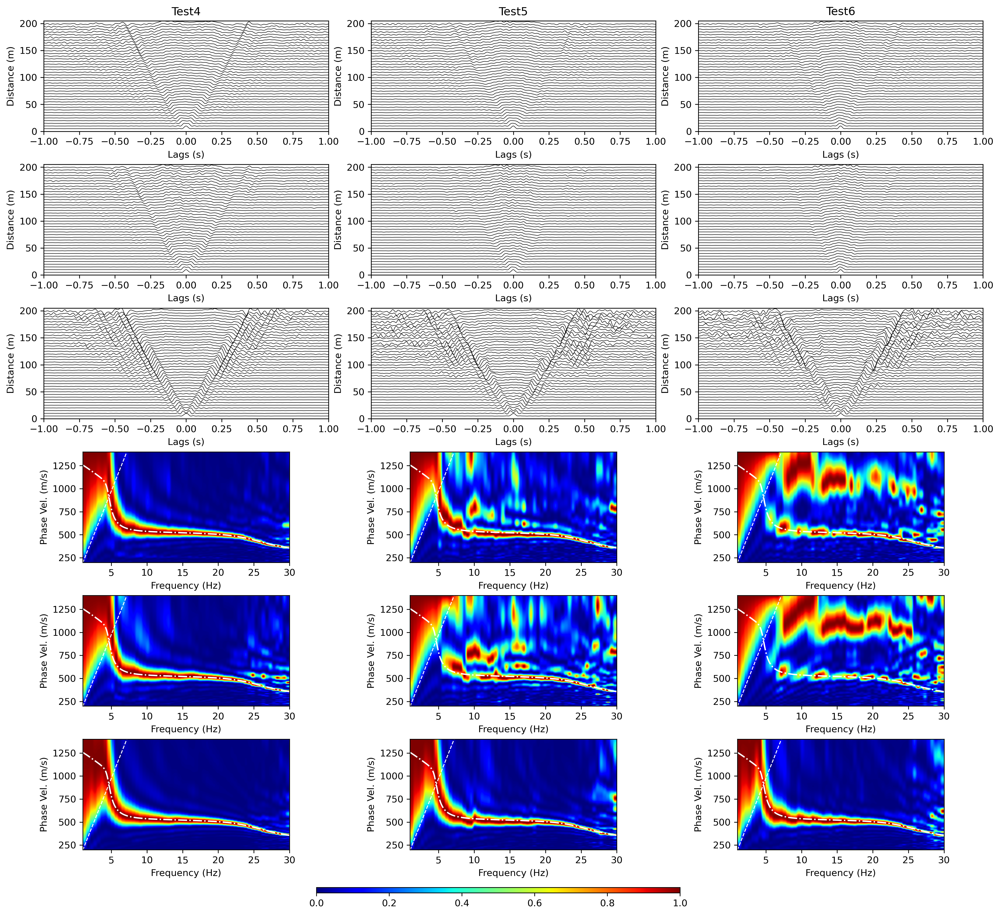

In [13]:
fig = plt.figure(figsize=(18, 16), dpi=300)
aspect = (options['fmax'] - options['fmin']) / (options['vmax'] - options['vmin']) * 0.535
wiggle_scale = 5
count = 0
for itest in [4, 5, 6]:
    x = np.load('./synthetic data/c_segs_all_test' + str(itest) + '.npy').transpose((2, 0, 1))
    coeff = np.load('./synthetic data/pwscoeff_test' + str(itest) + '.npy')

    [ntr, nseg, nlag] = x.shape
    x = x / np.max(np.abs(x), axis=-1, keepdims=True)
    model.eval()
    with torch.no_grad():
        pred = model(torch.Tensor(x).to(device))
    pred = pred.detach().cpu().numpy()
    pred = pred / np.max(np.abs(pred), axis=-1, keepdims=True)

    # remove the padding zero
    x = x[:, :, 550:-550]
    pred = pred[:, :, 550:-550]

    # LS
    plt.subplot(6,3,1+count)
    ls = np.mean(x, axis=1).T
    ls = ls / np.max(ls, axis=0)
    for itr in range(ntr):
        plt.plot(lags, wiggle_scale * ls[:, itr] + (itr + 1) * 5, 'k', linewidth=0.5)
    plt.axis([-1, 1, 0, 205])
    plt.xlabel('Lags (s)')
    plt.ylabel('Distance (m)')
    plt.title('Test' + str(itest))

    # pws
    plt.subplot(6,3,4+count)
    pws = ls * np.abs(coeff) ** 1
    pws = pws / np.max(pws, axis=0)
    for itr in range(ntr):
        plt.plot(lags, wiggle_scale * pws[:, itr] + (itr + 1) * 5, 'k', linewidth=0.5)
    plt.axis([-1, 1, 0, 205])
    plt.xlabel('Lags (s)')
    plt.ylabel('Distance (m)')

    # ccformer
    plt.subplot(6,3,7+count)
    processed = np.squeeze(pred).T
    processed = processed / np.max(processed, axis=0)
    for itr in range(ntr):
        plt.plot(lags, wiggle_scale * processed[:, itr] + (itr + 1) * 5, 'k', linewidth=0.5)
    plt.axis([-1, 1, 0, 205])
    plt.xlabel('Lags (s)')
    plt.ylabel('Distance (m)')

    # use the symmetric cross-correlation for dispersion analysis
    vsg_ls = np.zeros((nhalf, ntr))
    vsg_ls[0, :] = ls[nhalf-1, :]
    vsg_ls[1:, :] = ls[nhalf:, :] + ls[nhalf-2::-1, :]
    
    vsg_pws = np.zeros((nhalf, ntr))
    vsg_pws[0, :] = pws[nhalf-1, :]
    vsg_pws[1:, :] = pws[nhalf:, :] + pws[nhalf-2::-1, :]
    
    vsg_processed = np.zeros((nhalf, ntr))
    vsg_processed[0, :] = processed[nhalf-1, :]
    vsg_processed[1:, :] = processed[nhalf:, :] + processed[nhalf-2::-1, :]

    # Dispersion spectrum of LS
    data['d'] = vsg_ls
    freq, vel, spec = phase_shift(data, options)
    plt.subplot(6,3,10+count)
    plt.imshow((spec/np.max(spec, axis=0).reshape(1,-1)), aspect=aspect, cmap='jet', extent=[freq.min(), freq.max(), vel.max(), vel.min()], vmin=0, vmax=1)
    plt.gca().invert_yaxis()
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase Vel. (m/s)')
    plt.plot(np.squeeze(dc['freq']), dc['vr'], '-.w', linewidth=1.5, markersize=1)
    plt.plot(freq, 195.*freq, '--w', linewidth=1, markersize=1)
    plt.axis([options['fmin'], options['fmax'], options['vmin'], options['vmax']])

    # Dispersion spectrum of PWS
    data['d'] = vsg_pws
    freq, vel, spec = phase_shift(data, options)
    plt.subplot(6,3,13+count)
    plt.imshow((spec/np.max(spec, axis=0).reshape(1,-1)), aspect=aspect, cmap='jet', extent=[freq.min(), freq.max(), vel.max(), vel.min()], vmin=0, vmax=1)
    plt.gca().invert_yaxis()
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase Vel. (m/s)')
    plt.plot(np.squeeze(dc['freq']), dc['vr'], '-.w', linewidth=1.5, markersize=1)
    plt.plot(freq, 195.*freq, '--w', linewidth=1, markersize=1)
    plt.axis([options['fmin'], options['fmax'], options['vmin'], options['vmax']])

    # Dispersion spectrum of CCformer
    data['d'] = vsg_processed
    freq, vel, spec = phase_shift(data, options)
    plt.subplot(6,3,16+count)
    h = plt.imshow((spec/np.max(spec, axis=0).reshape(1,-1)), aspect=aspect, cmap='jet', extent=[freq.min(), freq.max(), vel.max(), vel.min()], vmin=0, vmax=1)
    plt.gca().invert_yaxis()
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Phase Vel. (m/s)')
    plt.plot(np.squeeze(dc['freq']), dc['vr'], '-.w', linewidth=1.5, markersize=1)
    plt.plot(freq, 195.*freq, '--w', linewidth=1, markersize=1)
    plt.axis([options['fmin'], options['fmax'], options['vmin'], options['vmax']])

    count += 1

fig.subplots_adjust(wspace=0.15, hspace=0.3)
cax = fig.add_axes([0.35, 0.07, 0.3, 0.005])
plt.colorbar(h, cax=cax, orientation='horizontal', pad=0.08, aspect=50, shrink=0.99)